## Setup


In [20]:
# from google.colab import drive
# drive.mount('/content/drive')

In [21]:
#!conda activate gnngeometry

In [1]:
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from functools import wraps

# Helper function for visualization.
%matplotlib inline
import matplotlib.pyplot as plt

## Generate Closed Helix

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import torch
from sklearn.neighbors import kneighbors_graph
import scipy as sc
import sklearn as sk
from sklearn.preprocessing import StandardScaler
import torch
from torch_geometric.data import Data
from torch_geometric.utils import from_scipy_sparse_matrix, to_undirected

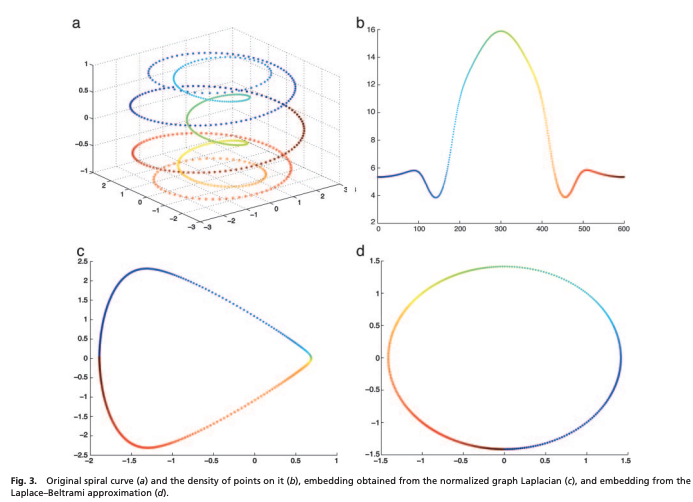

## Embeddings across $\alpha$

In [3]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [4]:
from diffusion_maps import *

In [31]:
x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 1, b = 1, n_samples = 1500)

In [32]:
X = np.zeros((1500, 3))
X[:,0] = x
X[:,1] = y
X[:,2] = z

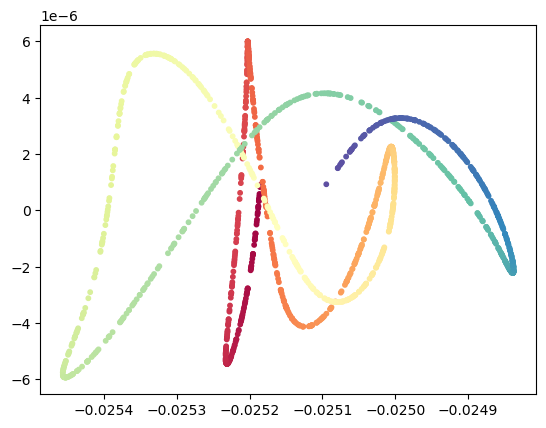

In [33]:
diff_embeddings = apply_diffusions(X, alpha = 1.0, n_eign = 2, n_diff = 10, epsilon = 10)
plt.scatter(*diff_embeddings.T, s = 10, c=t, cmap='Spectral')

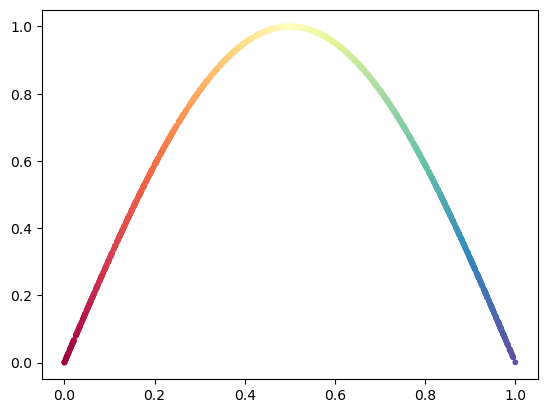

In [34]:
plt.scatter(t,z, s = 10, c=t, cmap='Spectral') # perfect embedding
perfect_embedding = np.zeros((1500,2))
perfect_embedding[:,0] = t
perfect_embedding[:,1] = z

In [35]:
from metrics import *
neighbor_kept_ratio_eval(dataset, diff_embeddings, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, diff_embeddings)
corr

tensor(0.8653)

0.27920521672554693

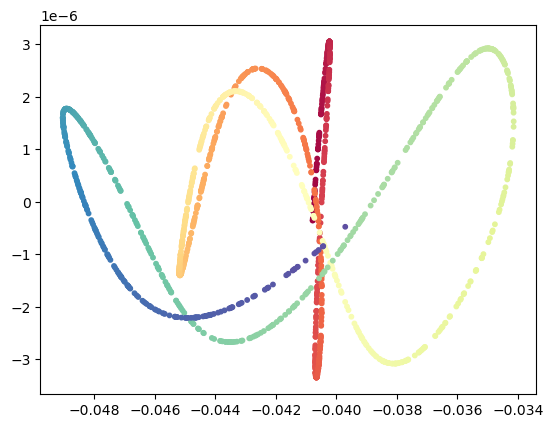

In [36]:
diff_embeddings = apply_diffusions(X, alpha = 0.0, n_eign = 2, n_diff = 10, epsilon = 10)
plt.scatter(*diff_embeddings.T, s = 10, c=t, cmap='Spectral')

In [37]:
neighbor_kept_ratio_eval(dataset, diff_embeddings, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, diff_embeddings)
corr

tensor(0.6631)

0.23948042773131906

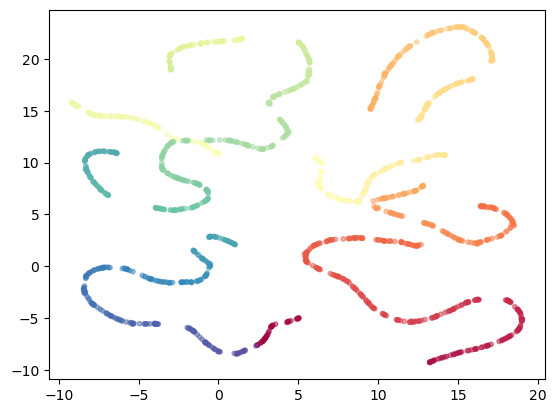

In [38]:
# import umap.umap_ as umap
import umap
umap_embedding = umap.UMAP(n_components=2, n_neighbors= 10, min_dist= 0.3).fit_transform(X)
plt.scatter(*umap_embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

In [39]:
neighbor_kept_ratio_eval(dataset, umap_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, umap_embedding)
corr

tensor(0.9891)

0.6966326013343419

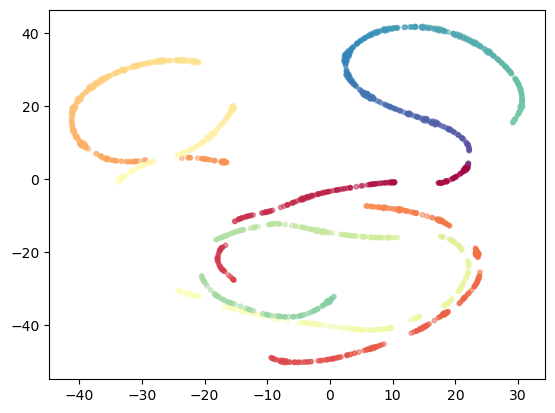

In [40]:
from sklearn.manifold import TSNE
tsne_embedding = TSNE(n_components = 2, learning_rate  = 'auto', init = 'random').fit_transform(X)
plt.scatter(*tsne_embedding.T, s = 10, c=t, alpha=0.5, cmap='Spectral')

In [41]:
neighbor_kept_ratio_eval(dataset, tsne_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, tsne_embedding)
corr

tensor(0.9824)

0.21900574190370226

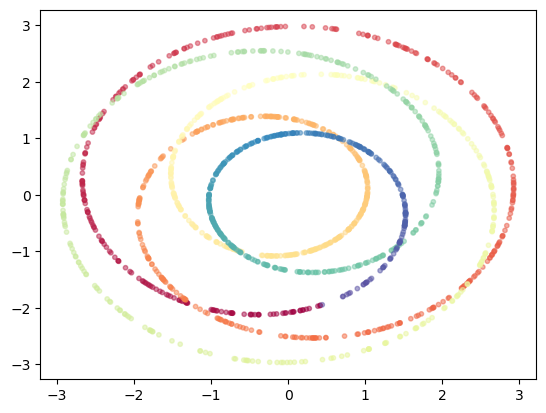

In [42]:
from sklearn.decomposition import PCA
pca_embedding = PCA(n_components = 2).fit_transform(X)
plt.scatter(*pca_embedding.T, s = 10, c=t, alpha=0.5, cmap='Spectral')

In [43]:
neighbor_kept_ratio_eval(dataset, pca_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, pca_embedding)
corr

tensor(0.9613)

0.057770813055913306

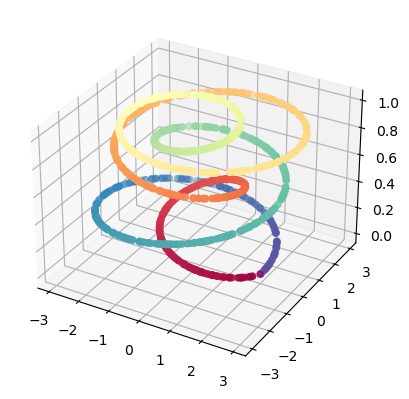

In [44]:
fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

In [5]:
import matplotlib.pyplot as plt
from scipy.special import beta, gamma
from numpy import linspace, exp
def beta_density_plot(a=1, b =1, n_samples = 500):
    x = linspace(.01, .99, n_samples)
    a = a
    b = b
    y = (1 / beta(a, b)) * x ** (a - 1) * (1 - x) ** (b - 1)
    return x, y
    # plt.figure(figsize = (12,8))
    #plt.scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
    #plt.show()

(0.0, 5.0)

Text(0.5, 1.0, '$ \\alpha $=1, $ \\beta $=1')

(0.0, 5.0)

Text(0.5, 1.0, '$ \\alpha $=.5, $ \\beta $=.5')

(0.0, 5.0)

Text(0.5, 1.0, '$ \\alpha $=1, $ \\beta $=5')

(0.0, 5.0)

Text(0.5, 1.0, '$ \\alpha $=2, $ \\beta $=2')

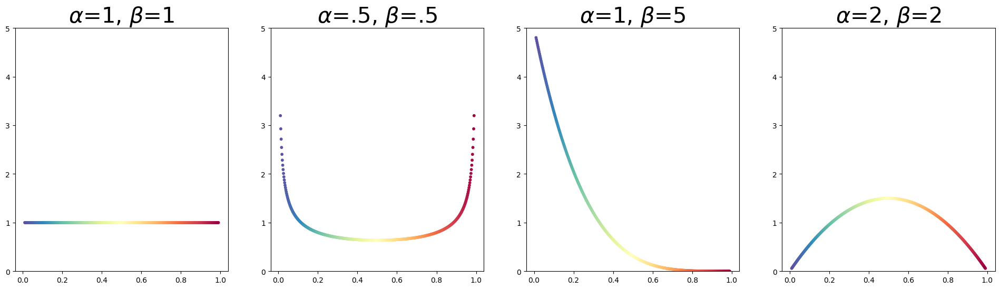

In [76]:
fig, ax = plt.subplots(1,4, figsize = (24,6))
x,y = beta_density_plot(1,1)
ax[0].scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
ax[0].set_ylim([0, 5])
ax[0].set_title(r'$ \alpha $'+'=1, '+r'$ \beta $'+'=1', fontsize = 30)
x,y = beta_density_plot(0.5,0.5)
ax[1].scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
ax[1].set_ylim([0, 5])
ax[1].set_title(r'$ \alpha $'+'=.5, '+r'$ \beta $'+'=.5', fontsize =30)
x,y = beta_density_plot(1,5)
ax[2].scatter(x,y,cmap = plt.cm.Spectral_r, c = x, s = 10)
ax[2].set_ylim([0, 5])
ax[2].set_title(r'$ \alpha $'+'=1, '+r'$ \beta $'+'=5', fontsize = 30)
x,y = beta_density_plot(2,2)
ax[3].scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
ax[3].set_ylim([0, 5])
ax[3].set_title(r'$ \alpha $'+'=2, '+r'$ \beta $'+'=2', fontsize = 30)

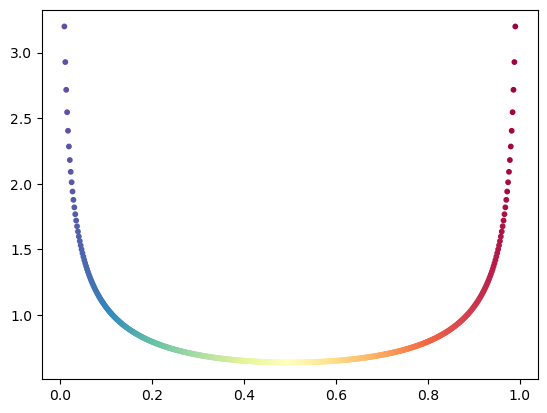

In [47]:
beta_density_plot(a=0.5, b = 0)

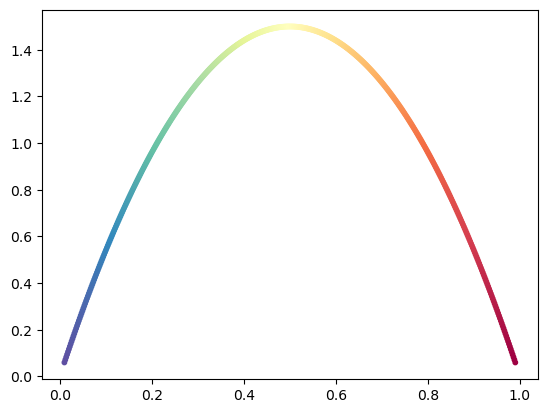

In [48]:
beta_density_plot(a=2, b = 2)

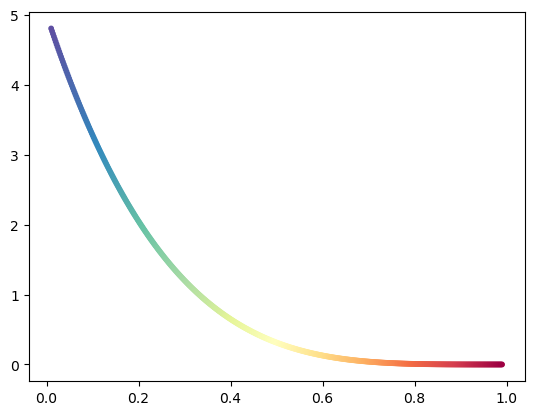

In [7]:
beta_density_plot(a=1, b = 5)

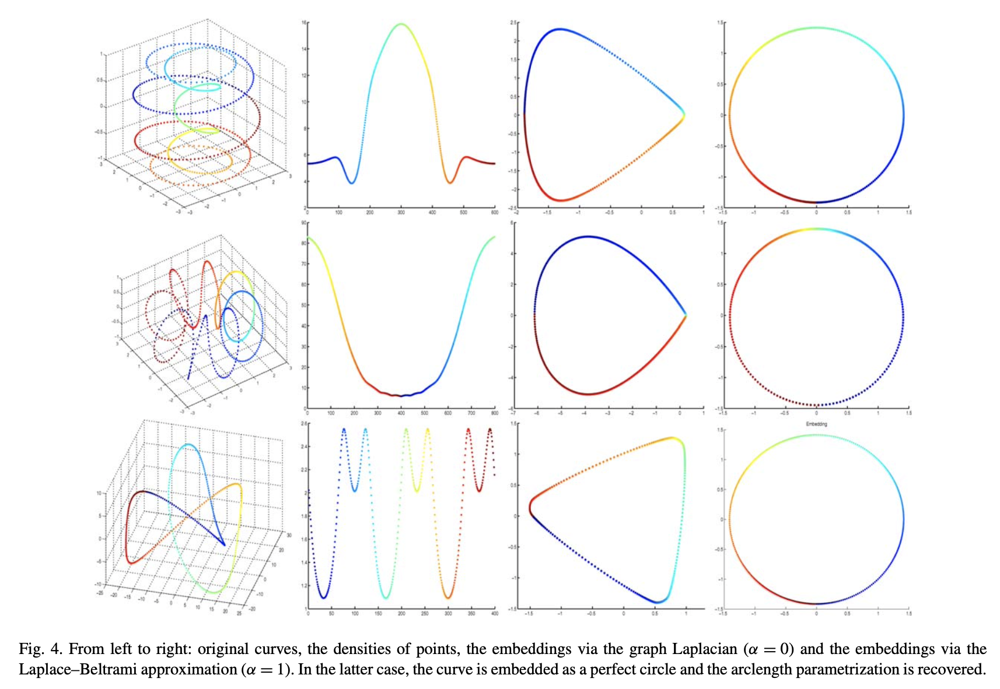

In [28]:
cd /Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook

/Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook


In [29]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=0.9139, time=0.1191
Epoch=001, loss=0.6894, time=0.0157
Epoch=002, loss=0.6055, time=0.0155
Epoch=003, loss=0.5746, time=0.0161
Epoch=004, loss=0.5668, time=0.0155
Epoch=005, loss=0.5698, time=0.0149
Epoch=006, loss=0.5900, time=0.0138
Epoch=007, loss=0.5658, time=0.0136
Epoch=008, loss=0.5673, time=0.0110
Epoch=009, loss=0.5675, time=0.0109
Epoch=010, loss=0.5803, time=0.0117
Epoch=011, loss=0.5733, time=0.0112
Epoch=012, loss=0.5640, time=0.0116
Epoch=013, loss=0.5530, time=0.0163
Epoch=014, loss=0.5418, time=0.0164
Epoch=015, loss=0.5597, time=0.0139
Epoch=016, loss=0.5867, time=0.0111
Epoch=017, loss=0.5884, time=0.0120
Epoch=018, loss=0.5828, time=0.0150
Epoch=019, loss=0.5339, time=0.0154
Epoch=020, loss=0.5490, time=0.0143
Epoch=021, loss=0.5575, time=0.0139
Epoch=022, loss=0.5358, time=0.0113
Epoch=023, loss=0.5430, time=0.0116
Epoch=024, loss=0.5419, time=0.0108
Epoch=025, loss=0.5458, time=0.0161
Epoch=026, loss=0.5392, time=0.0144
Epoc

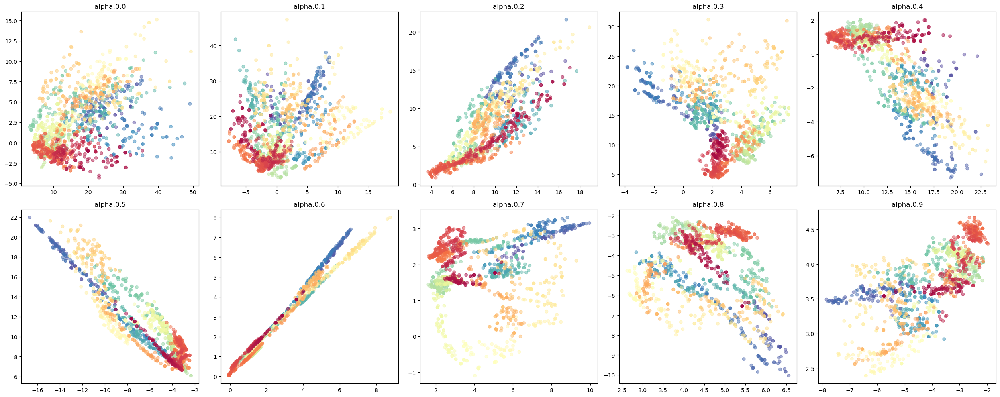

In [30]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.193714,0.207106,0.201130,0.202337,0.211427,0.231687,0.202424,0.249435,0.241222,0.227442,3
1,0.274220,0.303082,0.272772,0.276789,0.302809,0.321206,0.296797,0.422139,0.432703,0.394590,10
2,0.340715,0.396902,0.324701,0.335161,0.345163,0.370653,0.372862,0.551364,0.584834,0.536817,20
3,0.473910,0.564618,0.423246,0.457608,0.422760,0.493503,0.558917,0.772801,0.792042,0.732376,50
4,0.599274,0.719241,0.542398,0.635626,0.553946,0.690997,0.764824,0.912516,0.923526,0.856658,100


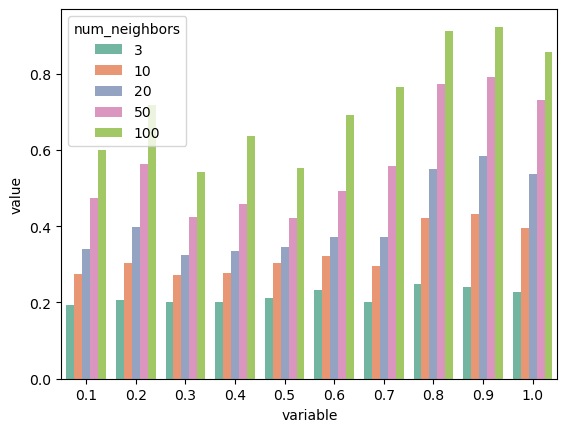

In [31]:
from metrics import *
knn_eval_plot(dataset,out)

,alpha,spearman,kendall_tau
0,0.1,0.185246,0.123597
1,0.2,0.152583,0.101560
2,0.3,0.238944,0.161205
3,0.4,0.204207,0.134230
4,0.5,0.220205,0.148116
5,0.6,0.235378,0.158625
6,0.7,0.186729,0.127116
7,0.8,0.287350,0.197368
8,0.9,0.211833,0.142074
9,1.0,0.178647,0.120035


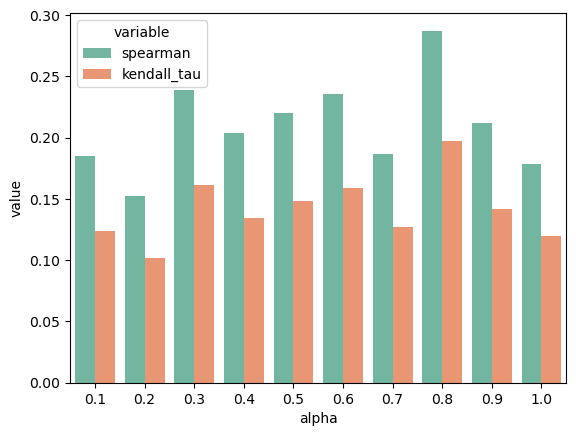

In [32]:
corr_eval_plot(perfect_embedding, out)

In [33]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, gnn_type = 'RW', 
              alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=0.7018, time=0.0264
Epoch=001, loss=0.6969, time=0.0211
Epoch=002, loss=0.6932, time=0.0119
Epoch=003, loss=0.6898, time=0.0110
Epoch=004, loss=0.6867, time=0.0114
Epoch=005, loss=0.6840, time=0.0100
Epoch=006, loss=0.6803, time=0.0110
Epoch=007, loss=0.6772, time=0.0102
Epoch=008, loss=0.6732, time=0.0103
Epoch=009, loss=0.6694, time=0.0098
Epoch=010, loss=0.6643, time=0.0113
Epoch=011, loss=0.6593, time=0.0100
Epoch=012, loss=0.6532, time=0.0103
Epoch=013, loss=0.6470, time=0.0097
Epoch=014, loss=0.6399, time=0.0097
Epoch=015, loss=0.6339, time=0.0122
Epoch=016, loss=0.6249, time=0.0105
Epoch=017, loss=0.6149, time=0.0106
Epoch=018, loss=0.6077, time=0.0120
Epoch=019, loss=0.6002, time=0.0157
Epoch=020, loss=0.5899, time=0.0153
Epoch=021, loss=0.5757, time=0.0152
Epoch=022, loss=0.5693, time=0.0144
Epoch=023, loss=0.5574, time=0.0146
Epoch=024, loss=0.5527, time=0.0130
Epoch=025, loss=0.5385, time=0.0142
Epoch=026, loss=0.5325, time=0.0110
Epoc

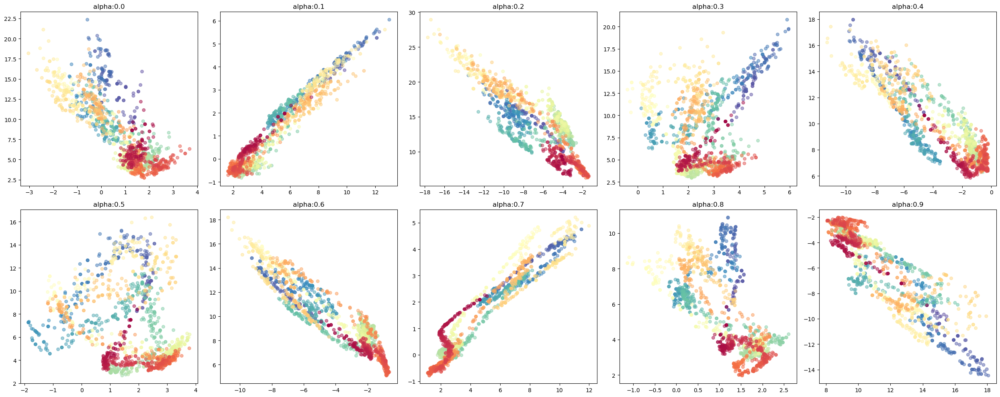

In [34]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.189501,0.181910,0.203639,0.207744,0.192594,0.225344,0.199337,0.225394,0.225188,0.235258,3
1,0.254793,0.247116,0.294865,0.292358,0.278993,0.345705,0.288703,0.388843,0.381845,0.402249,10
2,0.299265,0.292033,0.335756,0.341944,0.338537,0.435959,0.362473,0.516581,0.523562,0.548215,20
3,0.366747,0.366670,0.406063,0.467204,0.461870,0.608502,0.512251,0.720459,0.758146,0.772143,50
4,0.450187,0.465726,0.509029,0.629042,0.599272,0.790990,0.704093,0.867011,0.905205,0.899394,100


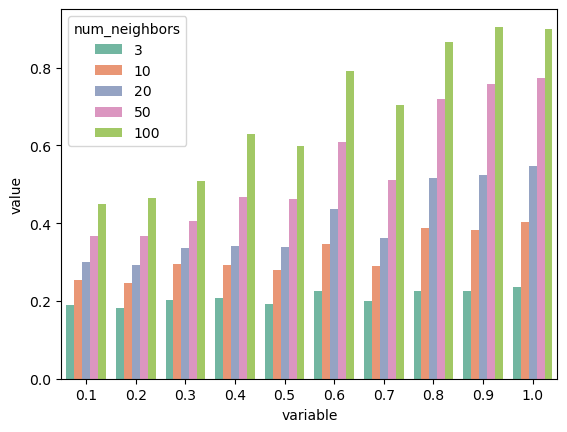

In [35]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.201590,0.136013
1,0.2,0.227644,0.152339
2,0.3,0.290814,0.193215
3,0.4,0.246647,0.166308
4,0.5,0.231339,0.156336
5,0.6,0.208863,0.140450
6,0.7,0.205006,0.139418
7,0.8,0.212937,0.145182
8,0.9,0.219574,0.148627
9,1.0,0.262203,0.179423


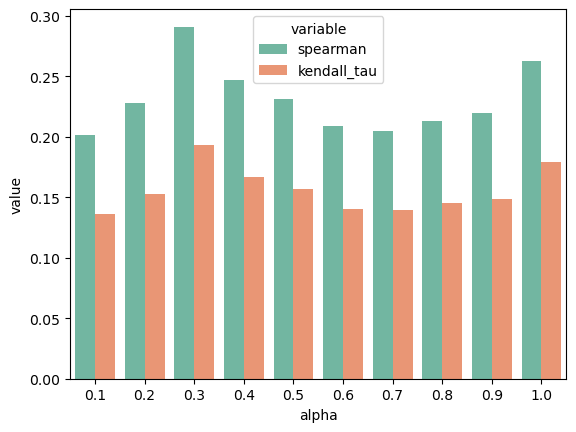

In [36]:
corr_eval_plot(perfect_embedding, out)

In [5]:
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *

In [45]:
out = {}
alpha = np.arange(0,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="symmetric", alpha=alpha[i+1], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp


=== train GRACE model ===
Epoch=000, loss=8.0293
Epoch=001, loss=7.6780
Epoch=002, loss=7.4369
Epoch=003, loss=7.3578
Epoch=004, loss=7.3226
Epoch=005, loss=8.6212
Epoch=006, loss=7.3159
Epoch=007, loss=7.3154
Epoch=008, loss=8.5850
Epoch=009, loss=7.4681
Epoch=010, loss=7.3211
Epoch=011, loss=7.3144
Epoch=012, loss=8.7787
Epoch=013, loss=7.3221
Epoch=014, loss=7.3802
Epoch=015, loss=7.3019
Epoch=016, loss=7.3031
Epoch=017, loss=7.2600
Epoch=018, loss=7.2189
Epoch=019, loss=8.6491
Epoch=020, loss=7.1691
Epoch=021, loss=7.8360
Epoch=022, loss=8.5264
Epoch=023, loss=7.3396
Epoch=024, loss=8.2507
Epoch=025, loss=7.2222
Epoch=026, loss=7.2389
Epoch=027, loss=7.2240
Epoch=028, loss=8.1302
Epoch=029, loss=7.2068
Epoch=030, loss=7.9893
Epoch=031, loss=7.1878
Epoch=032, loss=7.1701
Epoch=033, loss=7.1407
Epoch=034, loss=8.4348
Epoch=035, loss=7.8217
Epoch=036, loss=8.4026
Epoch=037, loss=7.0505
Epoch=038, loss=7.0492
Epoch=039, loss=8.0696
Epoch=040, loss=8.2652
Epoch=041, loss=8.1104
Epoch=04

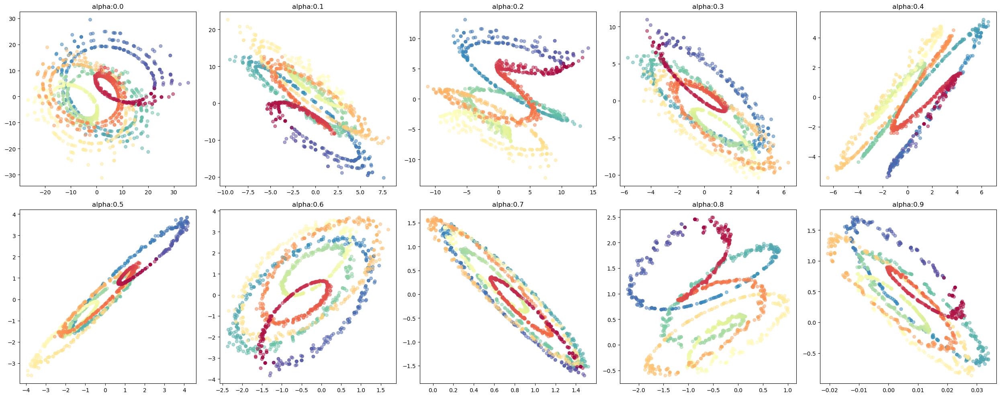

In [46]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [47]:
grace_symm_out = out

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.330290,0.329654,0.341438,0.348256,0.309790,0.302885,0.423340,0.362825,0.445356,0.251023,3
1,0.543727,0.508372,0.573062,0.606776,0.552209,0.552247,0.807378,0.678155,0.847848,0.428200,10
2,0.724866,0.633712,0.727755,0.757312,0.717422,0.699998,0.935536,0.837377,0.944726,0.582402,20
3,0.912998,0.815927,0.905602,0.927640,0.929497,0.879141,0.994480,0.957867,0.993812,0.831353,50
4,0.979947,0.933245,0.989066,0.984349,0.996169,0.967066,0.999700,0.993795,1.000000,0.967134,100


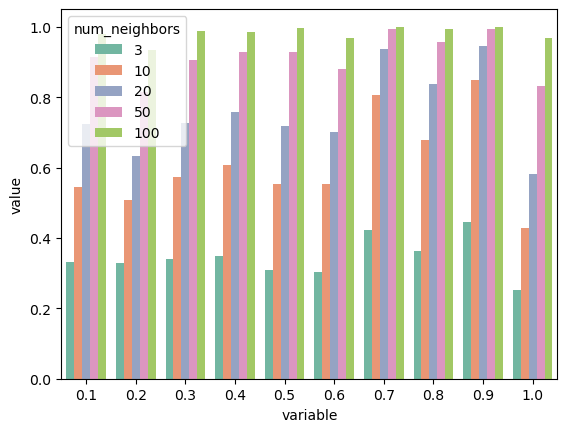

In [48]:
knn_eval_plot(dataset, out)

In [72]:
# global geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
cor = torch.zeros((10,2))
for i in range(10):       
    _,_,cor[i,0],_ = spearman_correlation_eval(perfect_embedding, grace_symm_out[i].detach().numpy())

corr = pd.DataFrame(cor)
corr.columns = exp
corr

,normal,diffusion
0,0.266230,0.0
1,0.247643,0.0
2,0.492886,0.0
3,0.221846,0.0
4,0.213469,0.0
5,0.378315,0.0
6,0.170988,0.0
7,0.098362,0.0
8,0.404344,0.0
9,0.099526,0.0


In [73]:
# local geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
res = torch.zeros((10,2))
for i in range(10):       
    res[i,0] = neighbor_kept_ratio_eval(dataset,grace_symm_out[i].detach().numpy(), n_neighbors = 5)
df = pd.DataFrame(res)
df.columns = exp
df

,normal,diffusion
0,0.414603,0.0
1,0.414701,0.0
2,0.432045,0.0
3,0.459504,0.0
4,0.399130,0.0
5,0.408721,0.0
6,0.606309,0.0
7,0.497664,0.0
8,0.660786,0.0
9,0.319033,0.0


In [53]:
def eval_density_preserve(X, X_news, sigma = 1.0, min_dist = 0.1):
    P = prob_high_dim(sigma = sigma, dist = euclidean_distances(X,X))
    _a, _b = find_ab_params(spread = sigma, min_dist = min_dist)
    Q = prob_low_dim(_a,_b,X_news)
    P = torch.tensor(P, dtype = torch.float)
    Q = torch.tensor(Q, dtype = torch.float)
    x_dist = torch.tensor(euclidean_distances(X,X), dtype = torch.float)
    y_dist = torch.tensor(euclidean_distances(X_news,X_news), dtype = torch.float)
    p_sum = 1/torch.sum(P, dim = 1)
    q_sum = 1/torch.sum(Q, dim = 1)
    R_p = p_sum * torch.sum(torch.mul(P,x_dist),dim = 0)
    R_q = q_sum * torch.sum(torch.mul(Q,y_dist),dim = 0)
    corr,_ = scipy.stats.pearsonr(R_p, R_q)
    return corr

In [80]:
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
dens = torch.zeros((10,2))
for i in range(10):       
    Y = grace_symm_out[i].detach().numpy()
    dens[i,0] = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
den = pd.DataFrame(dens)
den.columns = exp
den

,normal,diffusion
0,0.479578,0.0
1,0.447401,0.0
2,0.537944,0.0
3,0.455514,0.0
4,0.708323,0.0
5,0.408020,0.0
6,0.583992,0.0
7,0.561121,0.0
8,0.437664,0.0
9,0.458340,0.0


,alpha,spearman,kendall_tau
0,0.1,0.279070,0.191766
1,0.2,0.259358,0.176026
2,0.3,0.494117,0.352138
3,0.4,0.231657,0.158513
4,0.5,0.222546,0.151357
5,0.6,0.394766,0.270383
6,0.7,0.177665,0.121319
7,0.8,0.105629,0.071571
8,0.9,0.409066,0.287551
9,1.0,0.112138,0.075813


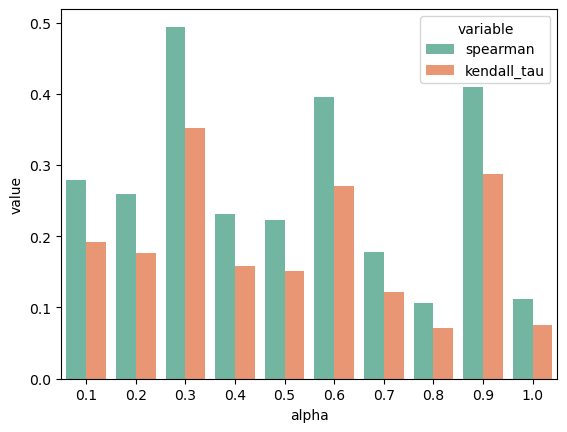

In [58]:
corr_eval_plot(perfect_embedding, out)

In [59]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="RW", alpha=alpha[i], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train GRACE model ===
Epoch=000, loss=7.9311
Epoch=001, loss=7.7045
Epoch=002, loss=7.5763
Epoch=003, loss=8.3394
Epoch=004, loss=8.1863
Epoch=005, loss=7.4978
Epoch=006, loss=8.0855
Epoch=007, loss=7.5581
Epoch=008, loss=7.5673
Epoch=009, loss=7.5062
Epoch=010, loss=7.5360
Epoch=011, loss=7.3842
Epoch=012, loss=8.1928
Epoch=013, loss=7.3089
Epoch=014, loss=7.3040
Epoch=015, loss=7.2985
Epoch=016, loss=8.3320
Epoch=017, loss=7.5043
Epoch=018, loss=7.3499
Epoch=019, loss=7.2845
Epoch=020, loss=7.2749
Epoch=021, loss=7.2692
Epoch=022, loss=7.4799
Epoch=023, loss=7.2724
Epoch=024, loss=7.2758
Epoch=025, loss=7.2785
Epoch=026, loss=7.3536
Epoch=027, loss=7.4077
Epoch=028, loss=7.4126
Epoch=029, loss=7.3940
Epoch=030, loss=7.3342
Epoch=031, loss=7.2588
Epoch=032, loss=7.3065
Epoch=033, loss=7.2594
Epoch=034, loss=7.2613
Epoch=035, loss=7.3111
Epoch=036, loss=8.6009
Epoch=037, loss=8.5717
Epoch=038, loss=7.7924
Epoch=039, loss=7.2966
Epoch=040, loss=7.2650
Epoch=041, loss=8.4752
Epoch=04

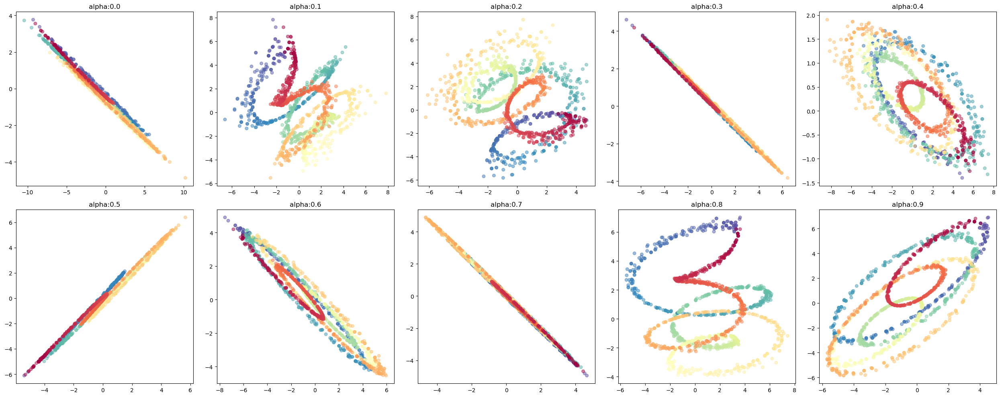

In [60]:
# row-normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.216765,0.304343,0.329125,0.226087,0.297031,0.253765,0.326185,0.251166,0.404266,0.435857,3
1,0.331384,0.498735,0.574164,0.344787,0.533603,0.426187,0.558269,0.393806,0.782550,0.851775,10
2,0.419635,0.643355,0.735978,0.425645,0.681535,0.552577,0.690489,0.510560,0.924242,0.958488,20
3,0.561980,0.861409,0.911929,0.583989,0.843966,0.740670,0.865188,0.717080,0.990885,0.998816,50
4,0.704906,0.964569,0.982504,0.798025,0.932856,0.902844,0.956223,0.910927,0.999394,1.000000,100


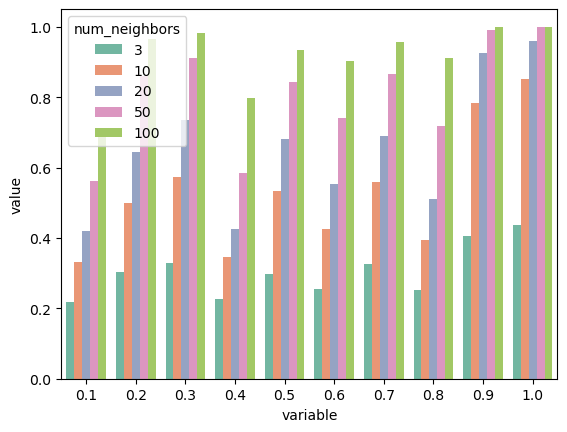

In [61]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.130842,0.088210
1,0.2,0.501005,0.356088
2,0.3,0.393867,0.273207
3,0.4,0.194800,0.132539
4,0.5,0.103047,0.069870
5,0.6,0.301123,0.206856
6,0.7,0.136011,0.092168
7,0.8,0.120708,0.081675
8,0.9,0.451818,0.317003
9,1.0,0.189866,0.129724


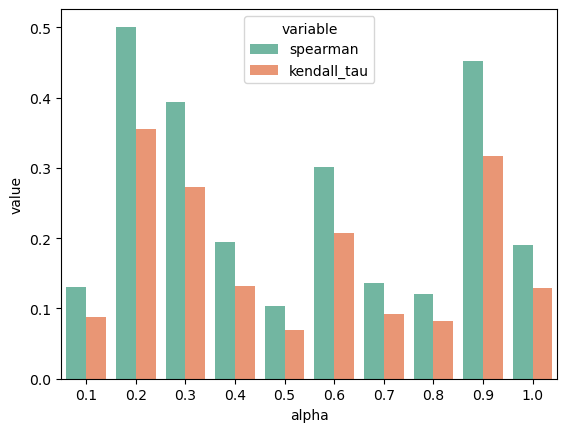

In [62]:
corr_eval_plot(perfect_embedding, out)

In [77]:
# global geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
# corr = torch.zeros((10,2))
for i in range(10):       
    _,_,cor[i,1],_ = spearman_correlation_eval(perfect_embedding, out[i].detach().numpy())

corr = pd.DataFrame(cor)
corr.columns = exp
corr

,normal,diffusion
0,0.266230,0.140334
1,0.247643,0.499147
2,0.492886,0.404060
3,0.221846,0.191440
4,0.213469,0.120278
5,0.378315,0.304735
6,0.170988,0.128839
7,0.098362,0.122862
8,0.404344,0.447178
9,0.099526,0.185494


In [78]:
# local geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
# res = torch.zeros((10,2))
for i in range(10):       
    res[i,1] = neighbor_kept_ratio_eval(dataset,out[i].detach().numpy(), n_neighbors = 5)
df = pd.DataFrame(res)
df.columns = exp
df

,normal,diffusion
0,0.414603,0.259251
1,0.414701,0.385744
2,0.432045,0.429025
3,0.459504,0.273423
4,0.399130,0.387430
5,0.408721,0.325504
6,0.606309,0.437516
7,0.497664,0.312287
8,0.660786,0.578422
9,0.319033,0.646040


In [81]:
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
# dens = torch.zeros((10,2))
for i in range(10):       
    Y = out[i].detach().numpy()
    dens[i,1] = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
den = pd.DataFrame(dens)
den.columns = exp
den

,normal,diffusion
0,0.479578,0.280144
1,0.447401,0.485378
2,0.537944,0.700179
3,0.455514,0.259648
4,0.708323,0.545862
5,0.408020,0.213283
6,0.583992,0.521473
7,0.561121,0.373755
8,0.437664,0.658866
9,0.458340,0.659821


### cca-ssg

In [ ]:
from models.cca_ssg import *
from models.train_models import train_cca_ssg
from models.baseline_models import *

In [ ]:
out = {}
alpha = np.arange(0.1,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'symmetric',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


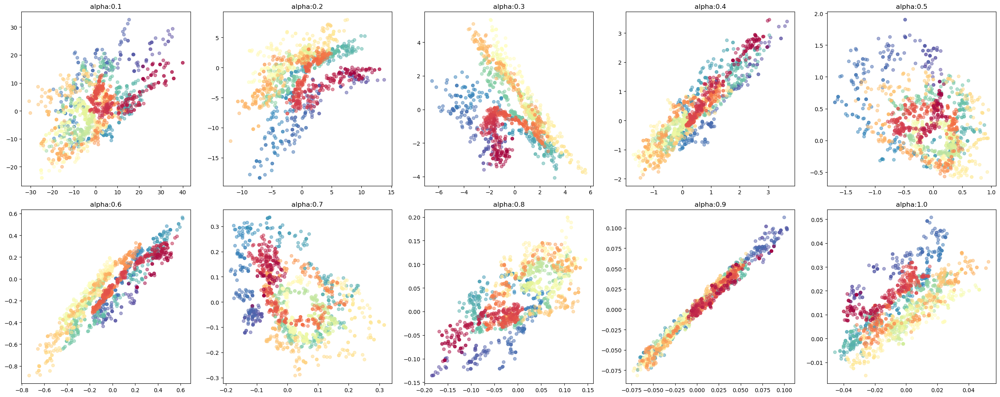

In [ ]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.223988,0.221817,0.240901,0.226117,0.269214,0.249130,0.282867,0.273253,0.190798,0.231907,3
1,0.426455,0.413782,0.439921,0.422565,0.531796,0.445885,0.571958,0.517669,0.321999,0.438840,10
2,0.592081,0.579419,0.603684,0.571539,0.716013,0.604279,0.760585,0.687214,0.460465,0.596686,20
3,0.826300,0.807085,0.815051,0.779739,0.911662,0.822217,0.931285,0.894575,0.667731,0.804794,50
4,0.937791,0.928919,0.937423,0.916645,0.984379,0.935885,0.983680,0.973148,0.826259,0.924551,100


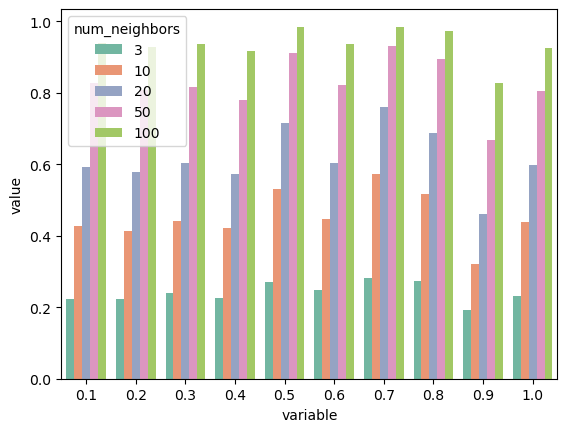

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.335809,0.231355
1,0.2,0.347738,0.238165
2,0.3,0.290888,0.201623
3,0.4,0.330048,0.226979
4,0.5,0.255037,0.174829
5,0.6,0.254200,0.171156
6,0.7,0.298621,0.200457
7,0.8,0.422541,0.295559
8,0.9,0.248463,0.168986
9,1.0,0.188096,0.127196


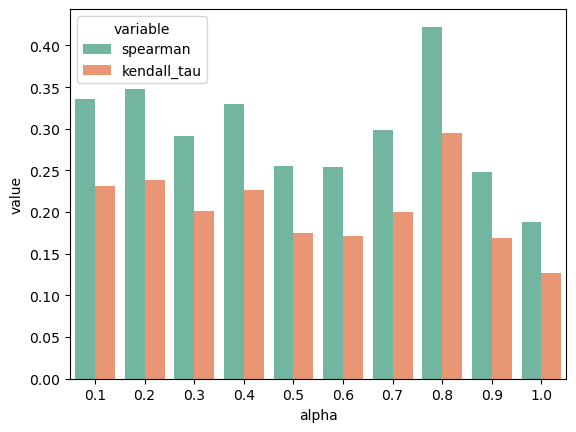

In [ ]:
corr_eval_plot(perfect_embedding, out)

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'RW',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


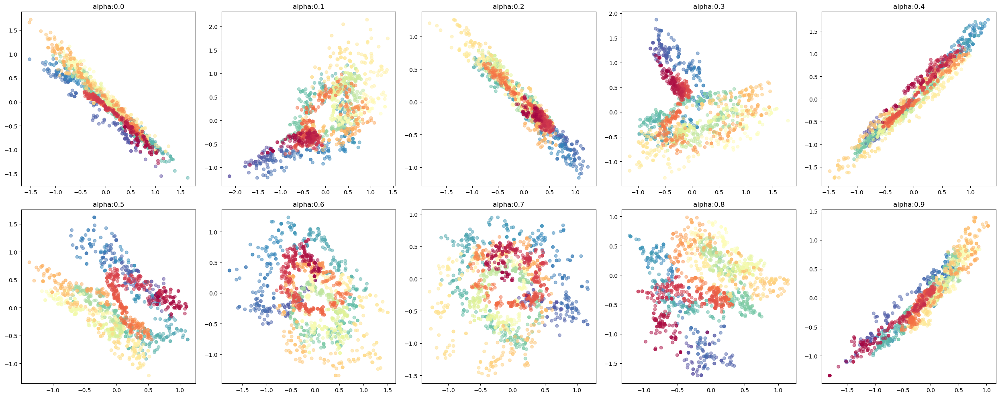

In [ ]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.197910,0.213410,0.189081,0.232704,0.221853,0.247723,0.291362,0.274147,0.269716,0.225585,3
1,0.322917,0.382180,0.306505,0.431573,0.392228,0.484980,0.584026,0.540977,0.533886,0.418228,10
2,0.435963,0.537828,0.424897,0.591915,0.517827,0.663742,0.781763,0.749902,0.712132,0.568684,20
3,0.630277,0.762714,0.621827,0.809541,0.699757,0.871412,0.943272,0.930065,0.910705,0.789805,50
4,0.790818,0.899960,0.782374,0.933444,0.846465,0.970125,0.992016,0.986134,0.978484,0.920839,100


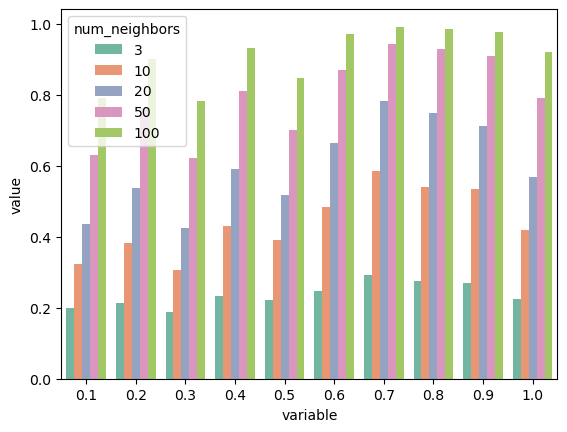

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.111778,0.074960
1,0.2,0.374083,0.258319
2,0.3,0.188727,0.128227
3,0.4,0.377502,0.262184
4,0.5,0.098755,0.065630
5,0.6,0.370491,0.256192
6,0.7,0.216014,0.147378
7,0.8,0.145981,0.099203
8,0.9,0.555022,0.396391
9,1.0,0.268088,0.182915


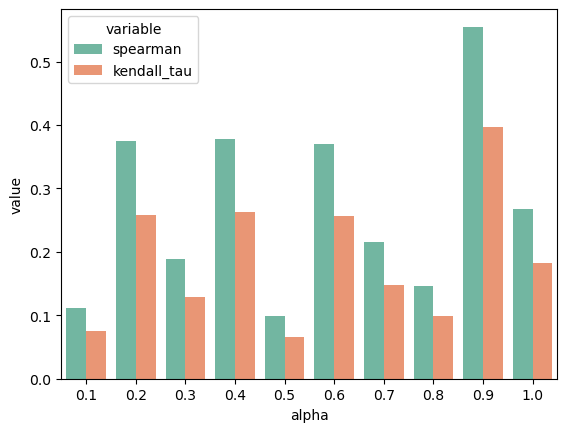

In [ ]:
corr_eval_plot(perfect_embedding, out)

### BGRL

In [ ]:
from models.bgrl import *
from models.train_models import train_bgrl
from models.baseline_models import *

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'symmetric',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=2.3527
Epoch=001, loss=2.5039
Epoch=002, loss=2.6217
Epoch=003, loss=2.2804
Epoch=004, loss=4.7933
Epoch=005, loss=2.4658
Epoch=006, loss=2.3580
Epoch=007, loss=2.3538
Epoch=008, loss=2.3281
Epoch=009, loss=2.4291
Epoch=010, loss=2.5355
Epoch=011, loss=2.3642
Epoch=012, loss=2.4197
Epoch=013, loss=2.3015
Epoch=014, loss=2.1966
Epoch=015, loss=2.5661
Epoch=016, loss=2.5619
Epoch=017, loss=2.3301
Epoch=018, loss=2.2740
Epoch=019, loss=2.2930
Epoch=020, loss=2.5179
Epoch=021, loss=2.1857
Epoch=022, loss=2.2487
Epoch=023, loss=2.2017
Epoch=024, loss=2.2042
Epoch=025, loss=2.6524
Epoch=026, loss=4.6639
Epoch=027, loss=2.2594
Epoch=028, loss=2.1774
Epoch=029, loss=2.1662
Epoch=030, loss=2.3890
Epoch=031, loss=2.0911
Epoch=032, loss=2.2066
Epoch=033, loss=2.0622
Epoch=034, loss=2.0745
Epoch=035, loss=2.1435
Epoch=036, loss=2.1229
Epoch=037, loss=2.2745
Epoch=038, loss=1.9488
Epoch=039, loss=2.1178
Epoch=040, loss=2.0025
Epoch=041, loss=2.2280
Epoch=042

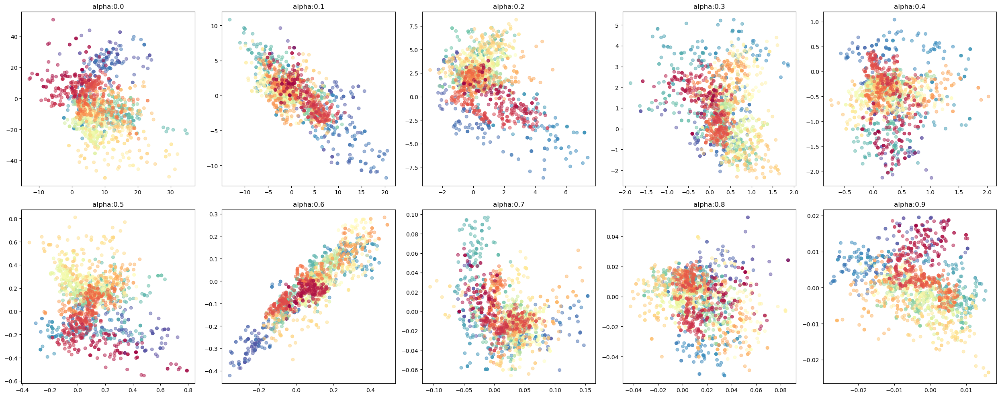

In [ ]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.181204,0.172081,0.186224,0.184881,0.192772,0.186018,0.183827,0.180670,0.182502,0.198161,3
1,0.283158,0.261698,0.295974,0.293941,0.328394,0.299807,0.314055,0.292085,0.301710,0.354247,10
2,0.381907,0.362248,0.392994,0.407716,0.451070,0.419752,0.433845,0.391055,0.425153,0.486216,20
3,0.585145,0.553064,0.574248,0.607770,0.635873,0.647100,0.649915,0.594102,0.635011,0.693317,50
4,0.756419,0.714761,0.712574,0.776542,0.790323,0.807107,0.827093,0.745938,0.787711,0.835209,100


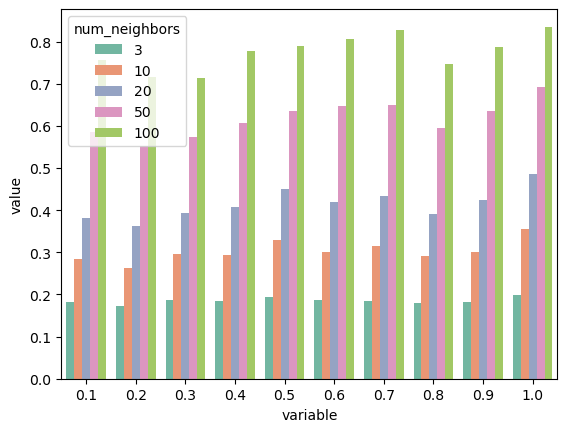

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.452261,0.311965
1,0.2,0.273367,0.186974
2,0.3,0.318186,0.213734
3,0.4,0.059563,0.039380
4,0.5,0.246376,0.165883
5,0.6,0.463586,0.320517
6,0.7,0.211203,0.144481
7,0.8,0.197453,0.133308
8,0.9,0.086029,0.057567
9,1.0,0.303758,0.206209


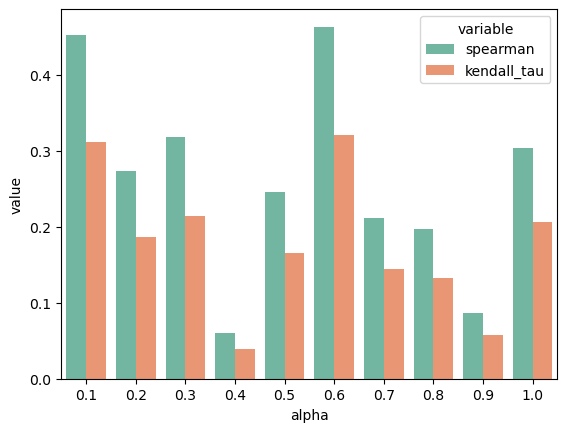

In [ ]:
corr_eval_plot(perfect_embedding, out)

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'RW',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=4.8661
Epoch=001, loss=4.0533
Epoch=002, loss=4.2823
Epoch=003, loss=4.1097
Epoch=004, loss=4.0657
Epoch=005, loss=3.9488
Epoch=006, loss=3.9367
Epoch=007, loss=3.8345
Epoch=008, loss=4.1457
Epoch=009, loss=4.2226
Epoch=010, loss=4.2285
Epoch=011, loss=4.2004
Epoch=012, loss=4.2814
Epoch=013, loss=4.4419
Epoch=014, loss=4.1345
Epoch=015, loss=4.0721
Epoch=016, loss=4.1390
Epoch=017, loss=4.0820
Epoch=018, loss=4.0977
Epoch=019, loss=4.2378
Epoch=020, loss=4.1993
Epoch=021, loss=4.0198
Epoch=022, loss=4.0114
Epoch=023, loss=4.1191
Epoch=024, loss=4.0122
Epoch=025, loss=4.1249
Epoch=026, loss=4.1693
Epoch=027, loss=3.7929
Epoch=028, loss=4.0613
Epoch=029, loss=4.2343
Epoch=030, loss=3.5920
Epoch=031, loss=4.0290
Epoch=032, loss=3.7104
Epoch=033, loss=3.7906
Epoch=034, loss=3.8702
Epoch=035, loss=4.0875
Epoch=036, loss=4.0442
Epoch=037, loss=4.2897
Epoch=038, loss=4.0250
Epoch=039, loss=3.8142
Epoch=040, loss=3.8723
Epoch=041, loss=3.8241
Epoch=042

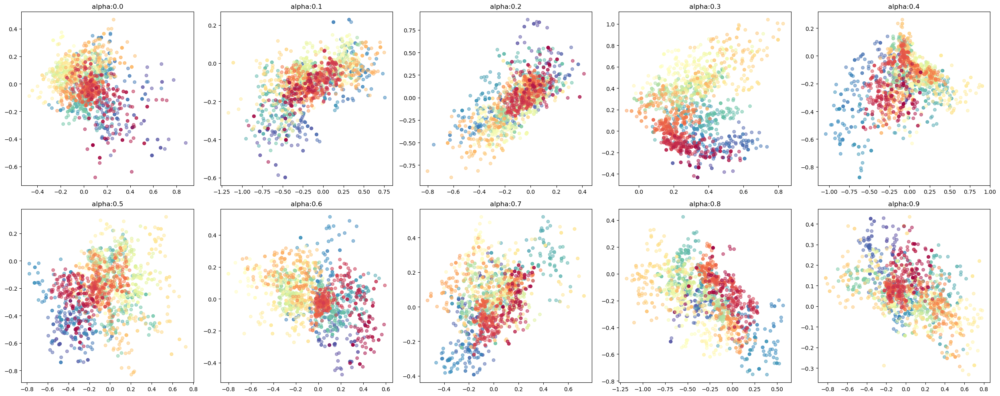

In [ ]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.168419,0.180379,0.177871,0.173907,0.198989,0.183166,0.190292,0.182190,0.207468,0.189896,3
1,0.258868,0.289862,0.293068,0.274422,0.344513,0.308162,0.337393,0.305632,0.370621,0.316376,10
2,0.352814,0.405600,0.408065,0.390345,0.466645,0.438600,0.471947,0.416500,0.517518,0.442235,20
3,0.548765,0.613499,0.596953,0.593611,0.686922,0.635240,0.674338,0.633532,0.732301,0.642469,50
4,0.732499,0.790879,0.761894,0.778529,0.848456,0.796301,0.814392,0.784643,0.879706,0.783337,100


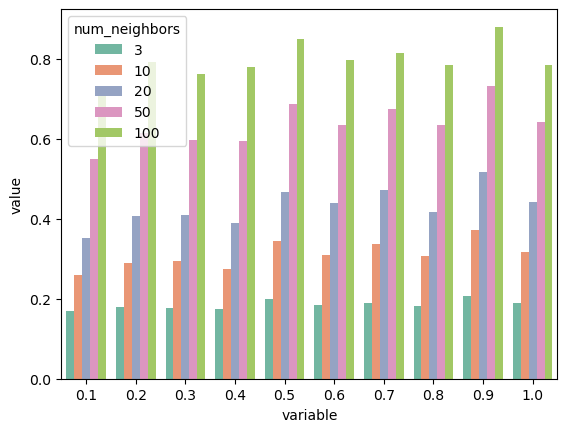

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.379606,0.262271
1,0.2,0.078317,0.052367
2,0.3,0.124387,0.083487
3,0.4,0.527326,0.372191
4,0.5,0.173230,0.114656
5,0.6,0.306354,0.206940
6,0.7,0.416422,0.287035
7,0.8,0.145626,0.096873
8,0.9,0.139575,0.093210
9,1.0,0.074215,0.049076


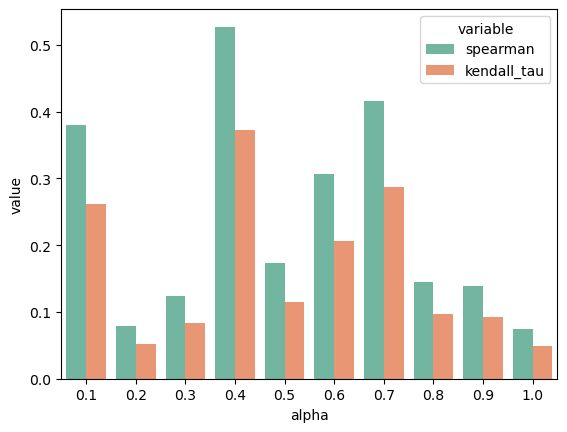

In [ ]:
corr_eval_plot(perfect_embedding, out)

## Repeated evaluations

In [6]:
from metrics import *

In [8]:
from models.grace import *
from models.train_models import *

In [9]:
def get_vhelix(uniform=True, a = 0.5, b = 0.5, seed = 1234, n_samples = 3000, n_neighbours = 5, features = 'coordinates', standardize=True):
    # reference: https://github.com/goroda/diffusion_maps/blob/main/gendata.py
    # plot vertical helix
    npts = n_samples
    if uniform is True:
        time = np.linspace(0, 1, npts);
    else:
        np.random.seed(seed)
        time = np.sort(np.random.beta(a, b, size=(npts)))


    height = np.sin(1.0 * np.pi * time)
    radius = np.sin(2.0 * 2.0 * np.pi * time) + 2.0
    x = radius * np.cos(5 * 2 * np.pi * time)
    y = radius * np.sin(5 * 2 * np.pi * time)

    X = np.vstack([np.array(x), np.array(y), np.array(height)]).T
    A = kneighbors_graph(X, n_neighbours, mode='distance', include_self=False)
    edge_index, edge_weights = from_scipy_sparse_matrix(A)
    edge_index, edge_weights = to_undirected(edge_index, edge_weights)
    if standardize:
      preproc = StandardScaler()
      X = preproc.fit_transform(X)
    if features == 'coordinates':
       new_data = Data(x=torch.from_numpy(X).float(),
                        edge_index=edge_index,
                        edge_weight=torch.exp(-edge_weights))
    else:
        new_data = Data(x=torch.eye(n_samples), edge_index=edge_index,
                        edge_weight=torch.exp(-edge_weights))
    return x,y, height, time, A, new_data

In [11]:
exp = 20
result = {}
for i in range(exp):
    x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 1, b = 5, n_samples = 500, seed = i, features='none', n_neighbours = 30)
    X = np.zeros((500, 3))
    X[:,0] = x
    X[:,1] = y
    X[:,2] = z
    perfect_embedding = np.zeros((500,1))
    perfect_embedding[:,0] = t
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 256, 3, n_layers=2, tau=0.5,
                        epochs=200, wd=1e-3, lr=1e-2, fmr=0.2, edr =0.5,
                        proj="standard", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp, n_points = 500)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 50)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            result[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=6.6028
Epoch=001, loss=5.6135
Epoch=002, loss=5.5858
Epoch=003, loss=5.5668
Epoch=004, loss=5.5670
Epoch=005, loss=5.5664
Epoch=006, loss=5.5582
Epoch=007, loss=5.5495
Epoch=008, loss=5.5557
Epoch=009, loss=5.5458
Epoch=010, loss=5.5523
Epoch=011, loss=5.5391
Epoch=012, loss=5.5405
Epoch=013, loss=5.5421


KeyboardInterrupt: 

In [34]:
results2 = result

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

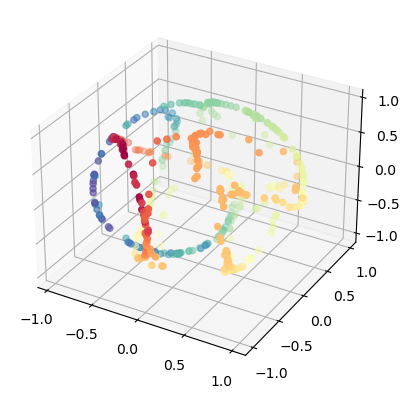

In [53]:
from sklearn.preprocessing import normalize
out = result['symmetric_' + str(alpha[5]) + '_' +  str(0)]['embedding']
out = normalize(out, axis = 1)
u = out
plt.figure()
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(u[:,0],u[:,1], u[:,2], c=y, cmap="Spectral")
# plt.savefig("grace_dbn_" + dataset_type + str(tau) + ".png")
plt.show()

In [73]:
tab = pd.DataFrame.from_dict(result).T
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_45698/4164987395.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.168020  0.874254 -0.134389
          0.2    0.155797  0.876296 -0.183499
          0.3    0.179067  0.869514 -0.071094
          0.4    0.150969  0.883070 -0.042656
          0.5    0.139376  0.874765 -0.006805
          0.6    0.168350  0.885000 -0.063630
          0.7    0.132297  0.875986  0.021591
          0.8    0.129899  0.877320  0.108684
          0.9    0.146571  0.882007  0.166753
          1.0    0.138563  0.886252  0.109605
symmetric 0.1    0.166572  0.884342  0.211026
          0.2    0.160653  0.879176  0.141597
          0.3    0.180713  0.896543 -0.004848
          0.4    0.149218  0.875286 -0.147970
          0.5    0.139327  0.869900 -0.171714
          0.6    0.132789  0.871840  0.057667
          0.7    0.153048  0.875959  0.144922
          0.8    0.148415  0.878099  0.201196
          0.9    0.133494  0.880449  0.409401
          1.0    0.138481  0.873431  0.352325

In [74]:
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_45698/2954017120.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.047933  0.017214  0.220169
          0.2    0.044394  0.029783  0.165670
          0.3    0.066725  0.037036  0.163700
          0.4    0.059842  0.034356  0.190825
          0.5    0.048155  0.027304  0.198052
          0.6    0.067311  0.025774  0.164509
          0.7    0.046766  0.019905  0.186435
          0.8    0.054876  0.033892  0.187567
          0.9    0.060725  0.027840  0.214831
          1.0    0.056050  0.028865  0.202976
symmetric 0.1    0.054076  0.027579  0.049303
          0.2    0.059620  0.028570  0.111174
          0.3    0.068291  0.026885  0.151503
          0.4    0.052962  0.018690  0.191655
          0.5    0.041650  0.027347  0.150782
          0.6    0.042991  0.035276  0.183736
          0.7    0.073233  0.022668  0.164252
          0.8    0.073486  0.037154  0.153634
          0.9    0.064930  0.025792  0.140967
          1.0    0.048871  0.021145  0.131395

In [ ]:
import pickle

# Store data 
with open('helix-no-feature-55.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(result, file)

In [67]:
import pickle
with open(r"helix-no-feature-22.pkl", "rb") as input_file:
     resultone = pickle.load(input_file)

In [60]:
exp = 20
result = {}
for i in range(exp):
    x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 2, b = 2, n_samples = 1500, seed = i)
    X = np.zeros((1500, 3))
    X[:,0] = x
    X[:,1] = y
    X[:,2] = z
    perfect_embedding = np.zeros((1500,2))
    perfect_embedding[:,0] = t
    perfect_embedding[:,1] = z
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 128, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            result[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=8.4737
Epoch=001, loss=7.8702
Epoch=002, loss=7.7337
Epoch=003, loss=8.0553
Epoch=004, loss=7.6984
Epoch=005, loss=8.0435
Epoch=006, loss=7.9146
Epoch=007, loss=7.4992
Epoch=008, loss=7.8187
Epoch=009, loss=7.8237
Epoch=010, loss=7.4133
Epoch=011, loss=8.0010
Epoch=012, loss=8.0489
Epoch=013, loss=7.3914
Epoch=014, loss=7.3810
Epoch=015, loss=7.3882
Epoch=016, loss=8.0993
Epoch=017, loss=7.3575
Epoch=018, loss=8.2687
Epoch=019, loss=8.0662
Epoch=020, loss=8.0465
Epoch=021, loss=7.9719
Epoch=022, loss=7.3936
Epoch=023, loss=7.7195
Epoch=024, loss=8.1498
Epoch=025, loss=7.4814
Epoch=026, loss=7.4482
Epoch=027, loss=7.8199
Epoch=028, loss=7.7884
Epoch=029, loss=7.7774
Epoch=030, loss=7.4314
Epoch=031, loss=7.7545
Epoch=032, loss=7.7302
Epoch=033, loss=7.3942
Epoch=034, loss=7.3832
Epoch=035, loss=8.1961
Epoch=036, loss=7.3962
Epoch=037, loss=7.4055
Epoch=038, loss=7.3855
Epoch=039, loss=8.0908
Epoch=040, loss=8.2893
Epoch=041, loss=7.4165
Epoch=04

KeyboardInterrupt: 

In [60]:
import pickle

# Store data 
with open('helix2020.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(result, file)

In [109]:
import pickle
with open(r"helix-repeat.pkl", "rb") as input_file:
     resultone = pickle.load(input_file)

In [123]:
tab2 = pd.DataFrame.from_dict(resultone).T
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_79395/1861953250.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.317628  0.347781  0.500440
          0.2    0.393700  0.361060  0.477220
          0.3    0.284185  0.357975  0.467758
          0.4    0.369999  0.383739  0.501132
          0.5    0.253148  0.402194  0.529361
          0.6    0.290584  0.431763  0.549720
          0.7    0.309001  0.487128  0.572832
          0.8    0.328861  0.506337  0.580720
          0.9    0.259275  0.554930  0.553458
          1.0    0.333158  0.634294  0.585064
symmetric 0.1    0.316208  0.406902  0.553775
          0.2    0.325618  0.388088  0.532369
          0.3    0.303608  0.396793  0.573276
          0.4    0.403399  0.413556  0.553972
          0.5    0.264441  0.430614  0.589143
          0.6    0.269591  0.425204  0.545975
          0.7    0.311998  0.463920  0.504795
          0.8    0.276172  0.490292  0.453298
          0.9    0.278810  0.485009  0.392027
          1.0    0.205039  0.505795  0.425862

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_79395/1861953250.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.155655  0.054508  0.148328
          0.2    0.157408  0.044710  0.122452
          0.3    0.175787  0.082969  0.167415
          0.4    0.180173  0.061385  0.099341
          0.5    0.169348  0.081447  0.166519
          0.6    0.164741  0.079605  0.135159
          0.7    0.164270  0.065931  0.120282
          0.8    0.166224  0.112385  0.189176
          0.9    0.130740  0.095755  0.195752
          1.0    0.163643  0.080780  0.155702
symmetric 0.1    0.155759  0.022189  0.119918
          0.2    0.164293  0.064681  0.163072
          0.3    0.190626  0.070421  0.144014
          0.4    0.141649  0.058053  0.168082
          0.5    0.169101  0.083124  0.168461
          0.6    0.169024  0.089333  0.141607
          0.7    0.199935  0.091604  0.151941
          0.8    0.152001  0.080033  0.161233
          0.9    0.176052  0.109566  0.152180
          1.0    0.156864  0.118821  0.157360

In [112]:
result['symmetric_0.9_24']['embedding']

tensor([[-1.1382,  0.0691],
        [-1.1382,  0.0691],
        [-1.1303,  0.0685],
        ...,
        [-1.1365,  0.0870],
        [-1.1365,  0.0870],
        [-1.1365,  0.0870]])

KeyError: 'symmetric_0.2_0'

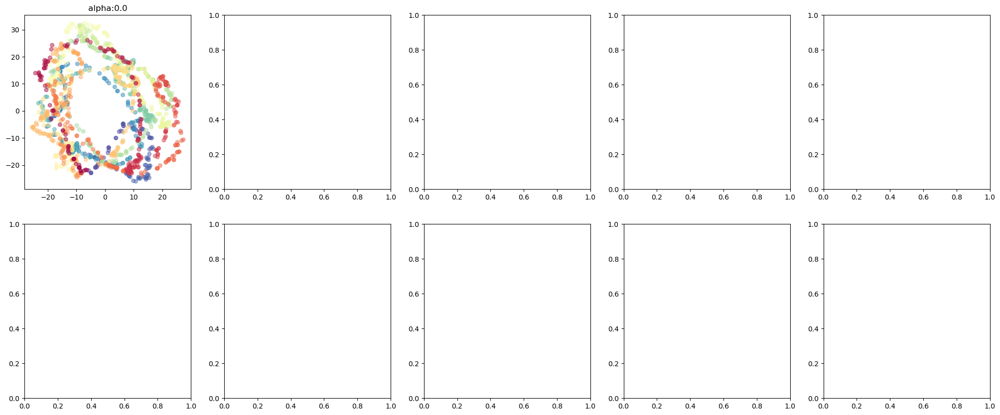

In [100]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(result['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],result['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

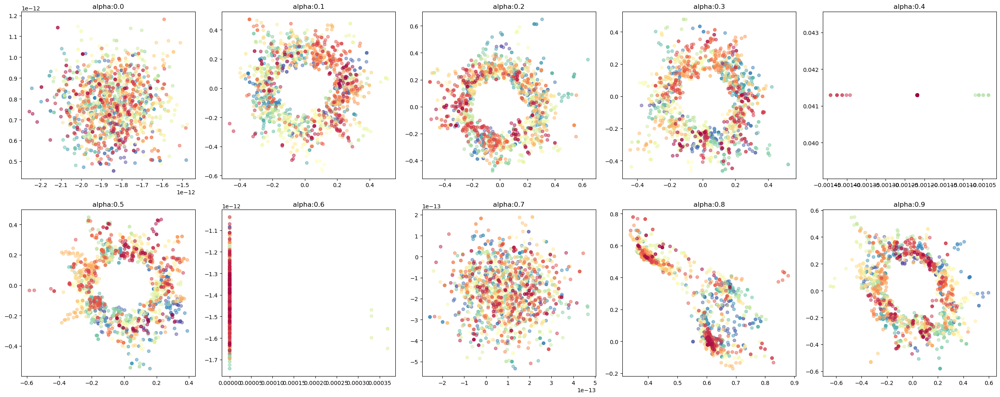

In [88]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(result['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],result['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

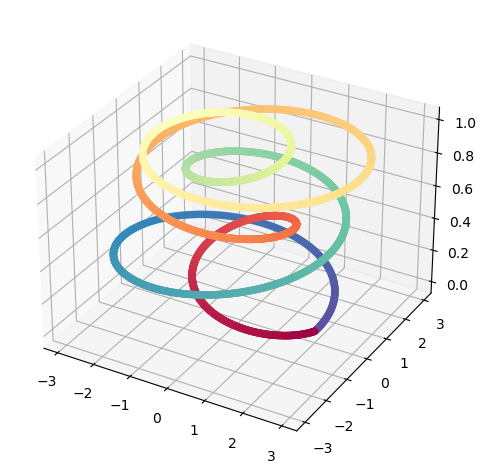

In [120]:
x,y,z,t, A,new_data = get_vhelix(uniform = True, n_samples = 5000)
plt.figure(figsize=(9,6))
fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t, s= 20)
plt.tight_layout()
plt.show()  # show train_acc and test_acc together


<Figure size 900x600 with 0 Axes>

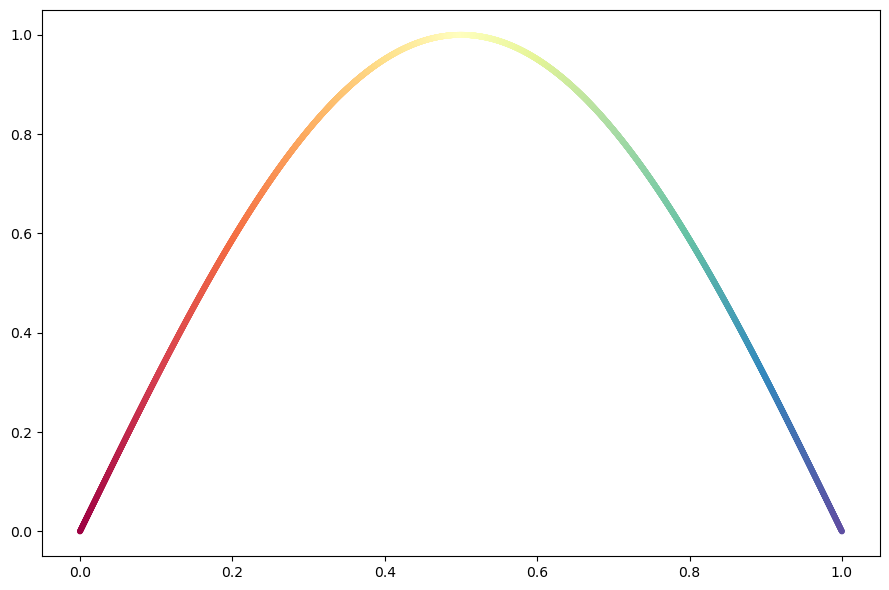

In [117]:
plt.figure(figsize=(9,6))

plt.scatter(t,z, s = 10, c=t, cmap='Spectral') # perfect embedding
plt.tight_layout()
plt.show()  # show train_acc and test_acc together

In [78]:
x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 2, b = 2, n_samples = 1500, seed = 1)